## Notebook for transferring labels from Kong-2023 stem cells to predicted stem cells using `scVI` and `SCANVi`

- **Developed by**: Anna Maguza
- **Institute of Computational Biology - Computational Health Centre - Helmholtz Munich**
- v230410

### Load required modules

In [1]:
import sys
import scvi
import torch
import anndata
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns

import numpy as np
import scipy as sp
import pandas as pd
import scanpy as sc
import numpy.random as random


from umap import UMAP
import warnings; warnings.simplefilter('ignore')

import matplotlib.pyplot as plt

/Users/anna.maguza/miniconda3/envs/scvi_env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Global seed set to 0
/Users/anna.maguza/miniconda3/envs/scvi_env/lib/python3.9/site-packages/flax/struct.py:132: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(data_clz, keypaths)
/Users/anna.maguza/miniconda3/envs/scvi_env/lib/python3.9/site-packages/flax/struct.py:132: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(data_clz, keypaths)
/Users/anna.maguza/miniconda3/envs/scvi_env/lib/python3.9/site-packages/flax/struct.py:132: FutureWarnin

In [2]:
%matplotlib inline
matplotlib.rcParams["pdf.fonttype"] = 42
matplotlib.rcParams["ps.fonttype"] = 42

In [3]:
torch.cuda.is_available()

False

In [4]:
torch.set_float32_matmul_precision('medium')

In [5]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.8.0
scanpy      1.9.3
-----
PIL                         9.4.0
absl                        NA
appnope                     0.1.2
asttokens                   NA
attr                        22.2.0
backcall                    0.2.0
beta_ufunc                  NA
binom_ufunc                 NA
brotli                      NA
certifi                     2022.12.07
cffi                        1.15.1
charset_normalizer          2.1.1
chex                        0.1.6
colorama                    0.4.6
comm                        0.1.2
contextlib2                 NA
cycler                      0.10.0
cython_runtime              NA
dateutil                    2.8.2
debugpy                     1.5.1
decorator                   5.1.1
defusedxml                  0.7.1
docrep                      0.3.2
entrypoints                 0.4
executing                   0.8.3
flax                        0.6.1
fsspec                      2023.3.0
h5py                        3.8.0
hypergeom_uf

In [6]:
arches_params = dict(
    use_layer_norm = "both",
    use_batch_norm = "none",
    encode_covariates = True,
    dropout_rate = 0.2,
    n_layers = 2,
)

In [7]:
def X_is_raw(adata):
    return np.array_equal(adata.X.sum(axis=0).astype(int), adata.X.sum(axis=0))

### Read in datasets

In [100]:
# Read reference (Kong-2023 dataset)
input_Kong = '/Users/anna.maguza/Desktop/Data/Gut_project/Healthy_gut_data/Kong_2023/Raw_anndata/Kong_2023_raw_anndata.h5ad'
output_Kong = '/Users/anna.maguza/Desktop/Data/Gut_project/Healthy_gut_data/Kong_2023/Processed_anndata/Kong_2023_raw_anndata_output.h5ad'
reference = sc.read(input_Kong)

In [78]:
# Read query (predicted Stem cells)
input_Stem = '/Users/anna.maguza/Desktop/Data/Processed_datasets/Predicted_stem_cells/Predicted_stem_cells.h5ad'
output_Stem = '/Users/anna.maguza/Desktop/Data/Processed_datasets/Predicted_stem_cells/Predicted_stem_cells_output.h5ad'
query = sc.read(input_Stem)

### Preprocess datasets

In [62]:
X_is_raw(query)

True

In [101]:
X_is_raw(reference)

True

In [102]:
# Filter out only healthy samples
reference = reference[reference.obs['disease__ontology_label'] == 'normal']

In [103]:
# Copy gene_id column in query.var as a first column in query.var with a name 'gene_name'
query.var.insert(0, 'gene_name', query.var.index)
# Make a gene name as index
query.var.index = query.var['gene_name']
# Delete gene_name column
del query.var['gene_name']

In [104]:
# Filter cells that have 'Stem cells' in reference.obs['Celltype']
stem_cells_list = ['Stem cells OLFM4 LGR5', 'Stem cells OLFM4 PCNA', 'Stem cells OLFM4 GSTA1', 'Stem cells OLFM4']
reference = reference[reference.obs['Celltype'].isin(stem_cells_list)]

In [105]:
reference.obs['seed_labels'] = reference.obs['Celltype'].copy()

In [106]:
query.obs['seed_labels'] = 'Unknown'

In [107]:
# Rename 'donor_id' column in reference.obs to 'Donor_ID'
reference.obs.rename(columns = {'donor_id': 'Donor_ID'}, inplace = True)
reference.obs['Study_name'] = 'Kong 2023'
reference.obs.rename(columns = {'biosample_id': 'Sample_ID'}, inplace = True)
reference.obs.rename(columns = {'tissue': 'Location'}, inplace = True)
#reference.obs.rename(columns = {'cell_type': 'Celltype'}, inplace = True)
query.obs.rename(columns = {'10X': 'library_preparation_protocol__ontology_label'}, inplace = True)

In [108]:
# Make gene_id as a first column in adata.var
reference.var.insert(0, 'gene_id', reference.var.index)
# Make a gene name as index 
reference.var.index = reference.var['gene_name']

In [109]:
reference.var

,gene_id,gene_name
gene_name,,
AL627309.1,ENSG00000237683,AL627309.1
AP006222.2,ENSG00000228463,AP006222.2
RP4-669L17.10,ENSG00000237094,RP4-669L17.10
RP11-206L10.3,ENSG00000235373,RP11-206L10.3
RP11-206L10.2,ENSG00000228327,RP11-206L10.2
...,...,...
LINC00676,ENSG00000234854,LINC00676
RP11-739N10.1,ENSG00000264151,RP11-739N10.1
CTB-60B18.18,ENSG00000268287,CTB-60B18.18


In [28]:
reference.obs_names_make_unique()
query.obs_names_make_unique()
reference.var_names_make_unique()
query.var_names_make_unique()

In [30]:
# Check if genes in reference and query are the same
genes_reference = list(reference.var.index)
genes_query = list(query.var.index)
genes_in_reference = [gene for gene in genes_query if gene in genes_reference]

In [88]:
# Check if genes in reference and query are the same
cells_reference = list(reference.obs.index)
cells_query = list(query.obs.index)
cells_in_reference = [cell for cell in cells_query if cell in cells_reference]

In [110]:
# Concatenate reference and query
adata = reference.concatenate(query, batch_key = 'dataset', batch_categories = ['reference', 'query'])

In [111]:
adata.X

<31298x23616 sparse matrix of type '<class 'numpy.float32'>'
	with 45010226 stored elements in Compressed Sparse Row format>

In [112]:
del reference, query

### Select HVGs - 3K

In [113]:
adata_raw = adata.copy()

In [114]:
adata.obs['seed_labels'].value_counts()

Unknown                   14938
Stem cells OLFM4           7053
Stem cells OLFM4 LGR5      4972
Stem cells OLFM4 PCNA      2931
Stem cells OLFM4 GSTA1     1404
Name: seed_labels, dtype: int64

In [116]:
sc.pp.log1p(adata)
adata.layers['counts'] = adata.X.copy()
adata.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 31298 × 23616
    obs: 'cell_type', 'Location', 'batch', 'Sample_ID', 'n_genes', 'n_counts', 'Chem', 'Site', 'Type', 'Donor_ID', 'Layer', 'Celltype', 'sex', 'species', 'species__ontology_label', 'library_preparation_protocol', 'library_preparation_protocol__ontology_label', 'organ', 'organ__ontology_label', 'disease', 'disease__ontology_label', 'seed_labels', 'Study_name', 'UniqueCell_ID', 'CellType', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Gender', 'n_genes_by_counts', 'total_counts_mt', 'doublet_scores', 'predicted_doublets', 'Age_group', 'total_counts_ribo', 'percent_mito', 'percent_ribo', 'Cell States', 'Cell Label', 'dataset'
    var: 'gene_id-reference', 'gene_name-reference'
    uns: 'log1p'
    layers: 'counts'>

In [120]:
adata.obs['Donor_ID'].value_counts()

A33 (414C)    7402
180844        3281
197396        2221
102141        1971
158108        1709
              ... 
N12              3
T044             3
T161             3
N49              2
T036NEG          1
Name: Donor_ID, Length: 77, dtype: int64

In [121]:
# Delete donor T036NEG from andata
adata = adata[adata.obs['Donor_ID'] != 'T036NEG']

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49,
  50,
  51,
  52,
  53,
  54,
  55,
  56,
  57,
  58,
  59,
  60,
  61,
  62,
  63,
  64,
  65,
  66,
  67,
  68,
  69,
  70,
  71,
  72,
  73,
  74,
  75],
 [Text(0, 0, 'A33 (414C)'),
  Text(1, 0, '180844'),
  Text(2, 0, '197396'),
  Text(3, 0, '102141'),
  Text(4, 0, '158108'),
  Text(5, 0, 'N10'),
  Text(6, 0, 'F72'),
  Text(7, 0, 'N15'),
  Text(8, 0, 'F73'),
  Text(9, 0, 'N11'),
  Text(10, 0, 'N18'),
  Text(11, 0, 'N21'),
  Text(12, 0, 'Wang_Donor_1'),
  Text(13, 0, 'N51'),
  Text(14, 0, 'N16'),
  Text(15, 0, 'BRC2043'),
  Text(16, 0, 'N46'),
  Text(17, 0, 'BRC2121'),
  Text(18, 0, 'BRC2258'),
  Text(19, 0, 'N20'),
  Text(20, 0, '110216'),
  Text(21, 0, 'N17'),
  Text(22, 0, 'N13'),
  Text(23, 0, 

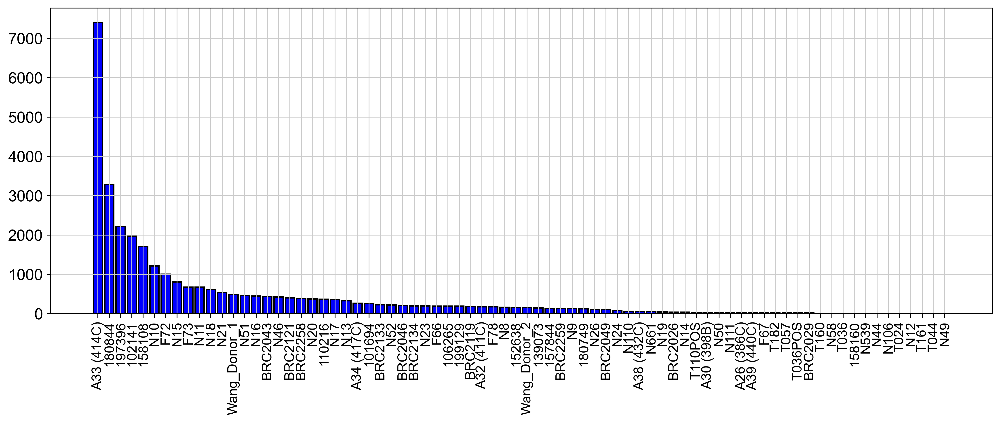

In [122]:
#Create a barplot of the number of cells per cell type in the anndata_pediatric object
plt.figure(figsize = (15, 5))
plt.bar(adata.obs["Donor_ID"].value_counts().index, adata.obs["Donor_ID"].value_counts(), color = "blue", edgecolor = "black", linewidth = 1.2)
plt.xticks(rotation = 90, fontsize = 12)

In [123]:
sc.pp.highly_variable_genes(
    adata,
    flavor = "seurat_v3",
    n_top_genes = 3000,
    layer = "counts",
    batch_key = "Donor_ID",
    subset = True,
    span = 1
)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


### Transfer of annotation with scANVI

In [124]:
scvi.model.SCVI.setup_anndata(adata, batch_key = 'Donor_ID', labels_key = "seed_labels", layer = 'counts')

In [125]:
scvi_model = scvi.model.SCVI(adata, n_latent = 50, n_layers = 3, dispersion = 'gene-batch', gene_likelihood = 'nb')

In [126]:
scvi_model.train()

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 256/256: 100%|██████████| 256/256 [51:02<00:00, 10.62s/it, loss=512, v_num=1]

`Trainer.fit` stopped: `max_epochs=256` reached.


Epoch 256/256: 100%|██████████| 256/256 [51:02<00:00, 11.96s/it, loss=512, v_num=1]


### Label transfer with `scANVI` 

In [127]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(scvi_model, 'Unknown')

In [128]:
scanvi_model.train()

INFO     Training for 10 epochs.                                                                                   


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 10/10: 100%|██████████| 10/10 [03:43<00:00, 23.63s/it, loss=538, v_num=1]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 10/10: 100%|██████████| 10/10 [03:43<00:00, 22.39s/it, loss=538, v_num=1]


In [129]:
adata.obs["C_scANVI"] = scanvi_model.predict(adata)

- Extract latent representation

In [130]:
adata.obsm["X_scANVI"] = scanvi_model.get_latent_representation(adata)

- Visualise corrected dataset

In [131]:
sc.pp.neighbors(adata, use_rep = "X_scANVI", n_neighbors = 50, metric = 'minkowski')
sc.tl.umap(adata, min_dist = 0.2, spread = 2, random_state = 1712)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:12)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:17)


In [132]:
adata.obs

,cell_type,Location,batch,Sample_ID,n_genes,n_counts,Chem,Site,Type,Donor_ID,...,Age_group,total_counts_ribo,percent_mito,percent_ribo,Cell States,Cell Label,dataset,_scvi_batch,_scvi_labels,C_scANVI
cell_id,,,,,,,,,,,,,,,,,,,,,
H197396_N1-GCAGCCAAGGCTCATT-reference,Epithelial,Colon,1,H197396_N1,3143,18417,v2,CO,Heal,197396,...,NaN,NaN,NaN,NaN,NaN,NaN,reference,11,2,Stem cells OLFM4 LGR5
H197396_N1-CTCTGGTTCACTCCTG-reference,Epithelial,Colon,1,H197396_N1,2681,11580,v2,CO,Heal,197396,...,NaN,NaN,NaN,NaN,NaN,NaN,reference,11,2,Stem cells OLFM4 PCNA
H197396_N1-CCACCTACACCGGAAA-reference,Epithelial,Colon,1,H197396_N1,2367,9975,v2,CO,Heal,197396,...,NaN,NaN,NaN,NaN,NaN,NaN,reference,11,2,Stem cells OLFM4 PCNA
H197396_N1-CTGGTCTGTACTCGCG-reference,Epithelial,Colon,1,H197396_N1,2293,9798,v2,CO,Heal,197396,...,NaN,NaN,NaN,NaN,NaN,NaN,reference,11,2,Stem cells OLFM4 PCNA
H197396_N1-TAGGCATTCCCGACTT-reference,Epithelial,Colon,1,H197396_N1,2002,8951,v2,CO,Heal,197396,...,NaN,NaN,NaN,NaN,NaN,NaN,reference,11,2,Stem cells OLFM4 LGR5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
N110.LPA.TCGGGACGTCAACTGT-query,NaN,LP,nan,N110.LPA,1232,4384,NaN,NaN,NaN,N110,...,nan,nan,nan,nan,Stem_Cells_ext,Stem_Cells_ext,query,39,4,Stem cells OLFM4 LGR5
N110.LPA.TGAGCATTCCAGTAGT-query,NaN,LP,nan,N110.LPA,3181,15655,NaN,NaN,NaN,N110,...,nan,nan,nan,nan,Stem_Cells_ext,Stem_Cells_ext,query,39,4,Stem cells OLFM4 LGR5
N110.LPA.TGGCCAGAGAGGACGG-query,NaN,LP,nan,N110.LPA,4380,26921,NaN,NaN,NaN,N110,...,nan,nan,nan,nan,Stem_Cells_ext,Stem_Cells_ext,query,39,4,Stem cells OLFM4 LGR5


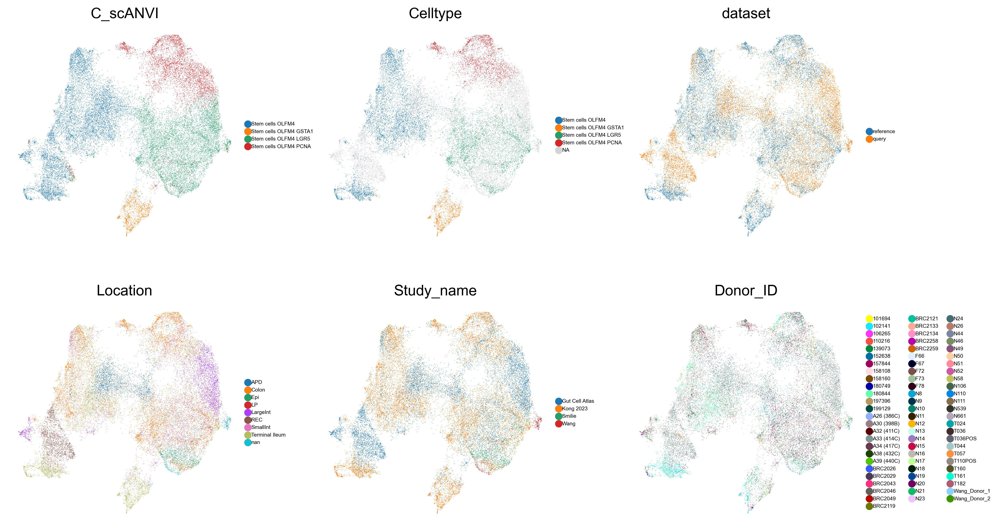

In [135]:
sc.pl.umap(adata, frameon = False, color = ['C_scANVI', 'Celltype', 'dataset', 'Location', 'Study_name', 'Donor_ID'], size = 0.6, legend_fontsize = 5, ncols = 3)

In [136]:
# Save anndata object
adata.write('/Users/anna.maguza/Desktop/Data/Processed_datasets/Predicted_stem_cells/stem_cells_and_Kong_labels_prediction_3K_HVG.h5ad')

### Select HVGs - 5K

In [139]:
adata = adata_raw.copy()

In [141]:
adata.obs['seed_labels'].value_counts()

Unknown                   14938
Stem cells OLFM4           7053
Stem cells OLFM4 LGR5      4972
Stem cells OLFM4 PCNA      2931
Stem cells OLFM4 GSTA1     1404
Name: seed_labels, dtype: int64

In [142]:
sc.pp.log1p(adata)
adata.layers['counts'] = adata.X.copy()
adata.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 31298 × 23616
    obs: 'cell_type', 'Location', 'batch', 'Sample_ID', 'n_genes', 'n_counts', 'Chem', 'Site', 'Type', 'Donor_ID', 'Layer', 'Celltype', 'sex', 'species', 'species__ontology_label', 'library_preparation_protocol', 'library_preparation_protocol__ontology_label', 'organ', 'organ__ontology_label', 'disease', 'disease__ontology_label', 'seed_labels', 'Study_name', 'UniqueCell_ID', 'CellType', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Gender', 'n_genes_by_counts', 'total_counts_mt', 'doublet_scores', 'predicted_doublets', 'Age_group', 'total_counts_ribo', 'percent_mito', 'percent_ribo', 'Cell States', 'Cell Label', 'dataset'
    var: 'gene_id-reference', 'gene_name-reference'
    uns: 'log1p'
    layers: 'counts'>

In [143]:
adata.obs['Donor_ID'].value_counts()

A33 (414C)    7402
180844        3281
197396        2221
102141        1971
158108        1709
              ... 
N12              3
T044             3
T161             3
N49              2
T036NEG          1
Name: Donor_ID, Length: 77, dtype: int64

In [144]:
# Delete donor T036NEG from andata
adata = adata[adata.obs['Donor_ID'] != 'T036NEG']

In [145]:
sc.pp.highly_variable_genes(
    adata,
    flavor = "seurat_v3",
    n_top_genes = 5000,
    layer = "counts",
    batch_key = "Donor_ID",
    subset = True,
    span = 1
)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


### Transfer of annotation with scANVI

In [146]:
scvi.model.SCVI.setup_anndata(adata, batch_key = 'Donor_ID', labels_key = "seed_labels", layer = 'counts')

In [147]:
scvi_model = scvi.model.SCVI(adata, n_latent = 50, n_layers = 3, dispersion = 'gene-batch', gene_likelihood = 'nb')

In [148]:
scvi_model.train()

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 256/256: 100%|██████████| 256/256 [54:48<00:00, 12.25s/it, loss=1.45e+03, v_num=1]

`Trainer.fit` stopped: `max_epochs=256` reached.


Epoch 256/256: 100%|██████████| 256/256 [54:48<00:00, 12.85s/it, loss=1.45e+03, v_num=1]


### Label transfer with `scANVI` 

In [149]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(scvi_model, 'Unknown')

In [150]:
scanvi_model.train()

INFO     Training for 10 epochs.                                                                                   


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 10/10: 100%|██████████| 10/10 [03:45<00:00, 22.79s/it, loss=1.47e+03, v_num=1]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 10/10: 100%|██████████| 10/10 [03:45<00:00, 22.52s/it, loss=1.47e+03, v_num=1]


In [151]:
adata.obs["C_scANVI"] = scanvi_model.predict(adata)

- Extract latent representation

In [152]:
adata.obsm["X_scANVI"] = scanvi_model.get_latent_representation(adata)

- Visualise corrected dataset

In [153]:
sc.pp.neighbors(adata, use_rep = "X_scANVI", n_neighbors = 50, metric = 'minkowski')
sc.tl.umap(adata, min_dist = 0.2, spread = 2, random_state = 1712)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:17)


In [154]:
adata.obs

,cell_type,Location,batch,Sample_ID,n_genes,n_counts,Chem,Site,Type,Donor_ID,...,Age_group,total_counts_ribo,percent_mito,percent_ribo,Cell States,Cell Label,dataset,_scvi_batch,_scvi_labels,C_scANVI
cell_id,,,,,,,,,,,,,,,,,,,,,
H197396_N1-GCAGCCAAGGCTCATT-reference,Epithelial,Colon,1,H197396_N1,3143,18417,v2,CO,Heal,197396,...,NaN,NaN,NaN,NaN,NaN,NaN,reference,11,2,Stem cells OLFM4 LGR5
H197396_N1-CTCTGGTTCACTCCTG-reference,Epithelial,Colon,1,H197396_N1,2681,11580,v2,CO,Heal,197396,...,NaN,NaN,NaN,NaN,NaN,NaN,reference,11,2,Stem cells OLFM4 LGR5
H197396_N1-CCACCTACACCGGAAA-reference,Epithelial,Colon,1,H197396_N1,2367,9975,v2,CO,Heal,197396,...,NaN,NaN,NaN,NaN,NaN,NaN,reference,11,2,Stem cells OLFM4 LGR5
H197396_N1-CTGGTCTGTACTCGCG-reference,Epithelial,Colon,1,H197396_N1,2293,9798,v2,CO,Heal,197396,...,NaN,NaN,NaN,NaN,NaN,NaN,reference,11,2,Stem cells OLFM4 LGR5
H197396_N1-TAGGCATTCCCGACTT-reference,Epithelial,Colon,1,H197396_N1,2002,8951,v2,CO,Heal,197396,...,NaN,NaN,NaN,NaN,NaN,NaN,reference,11,2,Stem cells OLFM4 LGR5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
N110.LPA.TCGGGACGTCAACTGT-query,NaN,LP,nan,N110.LPA,1232,4384,NaN,NaN,NaN,N110,...,nan,nan,nan,nan,Stem_Cells_ext,Stem_Cells_ext,query,39,4,Stem cells OLFM4 LGR5
N110.LPA.TGAGCATTCCAGTAGT-query,NaN,LP,nan,N110.LPA,3181,15655,NaN,NaN,NaN,N110,...,nan,nan,nan,nan,Stem_Cells_ext,Stem_Cells_ext,query,39,4,Stem cells OLFM4 LGR5
N110.LPA.TGGCCAGAGAGGACGG-query,NaN,LP,nan,N110.LPA,4380,26921,NaN,NaN,NaN,N110,...,nan,nan,nan,nan,Stem_Cells_ext,Stem_Cells_ext,query,39,4,Stem cells OLFM4 LGR5


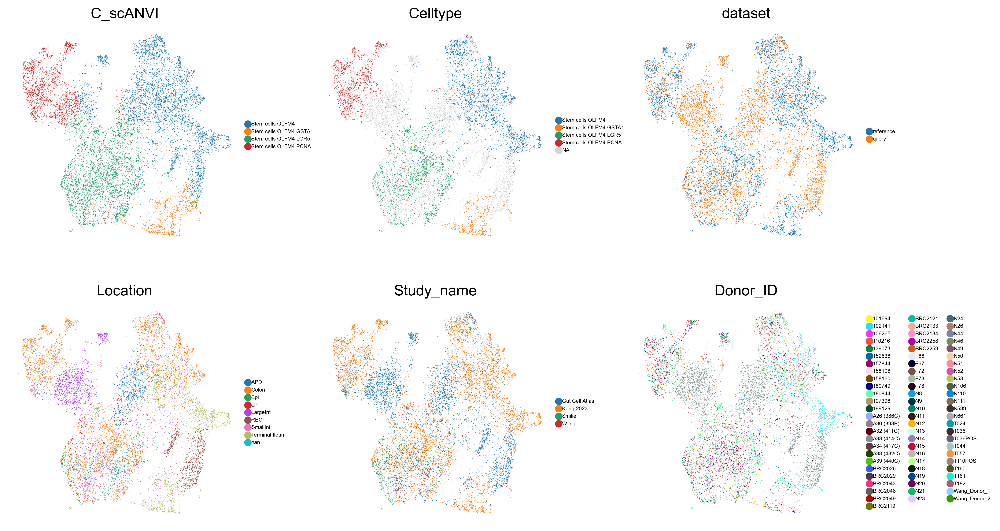

In [155]:
sc.pl.umap(adata, frameon = False, color = ['C_scANVI', 'Celltype', 'dataset', 'Location', 'Study_name', 'Donor_ID'], size = 0.6, legend_fontsize = 5, ncols = 3)

In [156]:
# Save anndata object
adata.write('/Users/anna.maguza/Desktop/Data/Processed_datasets/Predicted_stem_cells/stem_cells_and_Kong_labels_prediction_5K_HVG.h5ad')

### Select HVGs - 5K

In [157]:
adata = adata_raw.copy()

In [158]:
adata.obs['seed_labels'].value_counts()

Unknown                   14938
Stem cells OLFM4           7053
Stem cells OLFM4 LGR5      4972
Stem cells OLFM4 PCNA      2931
Stem cells OLFM4 GSTA1     1404
Name: seed_labels, dtype: int64

In [159]:
sc.pp.log1p(adata)
adata.layers['counts'] = adata.X.copy()
adata.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 31298 × 23616
    obs: 'cell_type', 'Location', 'batch', 'Sample_ID', 'n_genes', 'n_counts', 'Chem', 'Site', 'Type', 'Donor_ID', 'Layer', 'Celltype', 'sex', 'species', 'species__ontology_label', 'library_preparation_protocol', 'library_preparation_protocol__ontology_label', 'organ', 'organ__ontology_label', 'disease', 'disease__ontology_label', 'seed_labels', 'Study_name', 'UniqueCell_ID', 'CellType', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Gender', 'n_genes_by_counts', 'total_counts_mt', 'doublet_scores', 'predicted_doublets', 'Age_group', 'total_counts_ribo', 'percent_mito', 'percent_ribo', 'Cell States', 'Cell Label', 'dataset'
    var: 'gene_id-reference', 'gene_name-reference'
    uns: 'log1p'
    layers: 'counts'>

In [160]:
adata.obs['Donor_ID'].value_counts()

A33 (414C)    7402
180844        3281
197396        2221
102141        1971
158108        1709
              ... 
N12              3
T044             3
T161             3
N49              2
T036NEG          1
Name: Donor_ID, Length: 77, dtype: int64

In [161]:
# Delete donor T036NEG from andata
adata = adata[adata.obs['Donor_ID'] != 'T036NEG']

In [162]:
sc.pp.highly_variable_genes(
    adata,
    flavor = "seurat_v3",
    n_top_genes = 7000,
    layer = "counts",
    batch_key = "Donor_ID",
    subset = True,
    span = 1
)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


### Transfer of annotation with scANVI

In [163]:
scvi.model.SCVI.setup_anndata(adata, batch_key = 'Donor_ID', labels_key = "seed_labels", layer = 'counts')

In [164]:
scvi_model = scvi.model.SCVI(adata, n_latent = 50, n_layers = 3, dispersion = 'gene-batch', gene_likelihood = 'nb')

In [165]:
scvi_model.train()

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 256/256: 100%|██████████| 256/256 [1:24:11<00:00, 20.02s/it, loss=2.13e+03, v_num=1]

`Trainer.fit` stopped: `max_epochs=256` reached.


Epoch 256/256: 100%|██████████| 256/256 [1:24:11<00:00, 19.73s/it, loss=2.13e+03, v_num=1]


### Label transfer with `scANVI` 

In [166]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(scvi_model, 'Unknown')

In [167]:
scanvi_model.train()

INFO     Training for 10 epochs.                                                                                   


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 10/10: 100%|██████████| 10/10 [04:54<00:00, 29.39s/it, loss=2.13e+03, v_num=1]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 10/10: 100%|██████████| 10/10 [04:54<00:00, 29.44s/it, loss=2.13e+03, v_num=1]


In [168]:
adata.obs["C_scANVI"] = scanvi_model.predict(adata)

- Extract latent representation

In [169]:
adata.obsm["X_scANVI"] = scanvi_model.get_latent_representation(adata)

- Visualise corrected dataset

In [170]:
sc.pp.neighbors(adata, use_rep = "X_scANVI", n_neighbors = 50, metric = 'minkowski')
sc.tl.umap(adata, min_dist = 0.2, spread = 2, random_state = 1712)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:09)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:28)


In [171]:
adata.obs

,cell_type,Location,batch,Sample_ID,n_genes,n_counts,Chem,Site,Type,Donor_ID,...,Age_group,total_counts_ribo,percent_mito,percent_ribo,Cell States,Cell Label,dataset,_scvi_batch,_scvi_labels,C_scANVI
cell_id,,,,,,,,,,,,,,,,,,,,,
H197396_N1-GCAGCCAAGGCTCATT-reference,Epithelial,Colon,1,H197396_N1,3143,18417,v2,CO,Heal,197396,...,NaN,NaN,NaN,NaN,NaN,NaN,reference,11,2,Stem cells OLFM4 LGR5
H197396_N1-CTCTGGTTCACTCCTG-reference,Epithelial,Colon,1,H197396_N1,2681,11580,v2,CO,Heal,197396,...,NaN,NaN,NaN,NaN,NaN,NaN,reference,11,2,Stem cells OLFM4 LGR5
H197396_N1-CCACCTACACCGGAAA-reference,Epithelial,Colon,1,H197396_N1,2367,9975,v2,CO,Heal,197396,...,NaN,NaN,NaN,NaN,NaN,NaN,reference,11,2,Stem cells OLFM4 LGR5
H197396_N1-CTGGTCTGTACTCGCG-reference,Epithelial,Colon,1,H197396_N1,2293,9798,v2,CO,Heal,197396,...,NaN,NaN,NaN,NaN,NaN,NaN,reference,11,2,Stem cells OLFM4 LGR5
H197396_N1-TAGGCATTCCCGACTT-reference,Epithelial,Colon,1,H197396_N1,2002,8951,v2,CO,Heal,197396,...,NaN,NaN,NaN,NaN,NaN,NaN,reference,11,2,Stem cells OLFM4 LGR5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
N110.LPA.TCGGGACGTCAACTGT-query,NaN,LP,nan,N110.LPA,1232,4384,NaN,NaN,NaN,N110,...,nan,nan,nan,nan,Stem_Cells_ext,Stem_Cells_ext,query,39,4,Stem cells OLFM4 LGR5
N110.LPA.TGAGCATTCCAGTAGT-query,NaN,LP,nan,N110.LPA,3181,15655,NaN,NaN,NaN,N110,...,nan,nan,nan,nan,Stem_Cells_ext,Stem_Cells_ext,query,39,4,Stem cells OLFM4 LGR5
N110.LPA.TGGCCAGAGAGGACGG-query,NaN,LP,nan,N110.LPA,4380,26921,NaN,NaN,NaN,N110,...,nan,nan,nan,nan,Stem_Cells_ext,Stem_Cells_ext,query,39,4,Stem cells OLFM4 LGR5


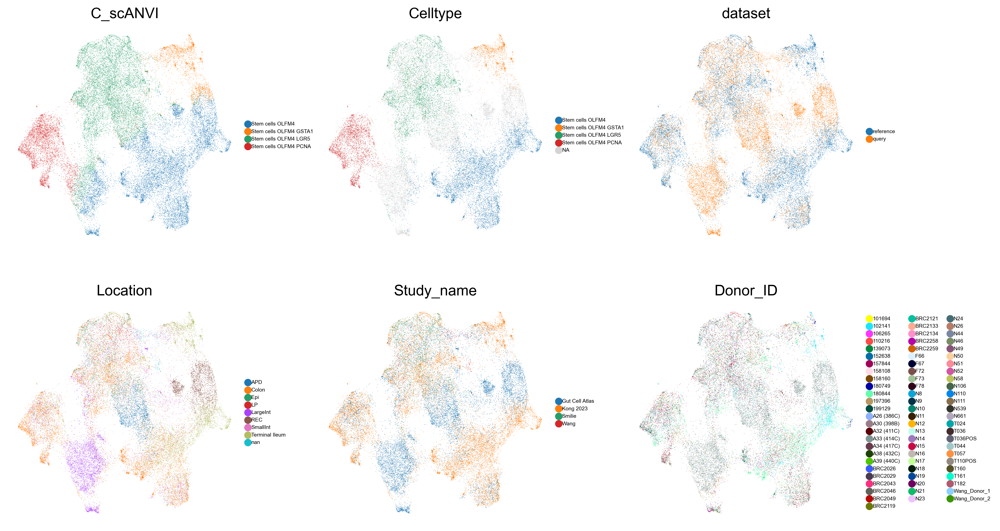

In [172]:
sc.pl.umap(adata, frameon = False, color = ['C_scANVI', 'Celltype', 'dataset', 'Location', 'Study_name', 'Donor_ID'], size = 0.6, legend_fontsize = 5, ncols = 3)

In [173]:
# Save anndata object
adata.write('/Users/anna.maguza/Desktop/Data/Processed_datasets/Predicted_stem_cells/stem_cells_and_Kong_labels_prediction_7K_HVG.h5ad')